In [11]:
import torch
from torch import nn
from torchvision import datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader
from torch.optim import Adam
import numpy as np
import matplotlib as mpl
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML


from models import NetD, NetG

In [12]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
display(f'Device {device} is available.')

'Device mps is available.'

In [13]:
dc_gen = NetG().to(device)
dc_dis = NetD().to(device)

batch_size = 128
#lr = 0.0002
lr = 0.001
epochs = 20
loss_fn = nn.BCELoss()
fixed_noise = torch.randn((batch_size, 100, 1,1), device=device)
# Other normalization factors are located here:  https://github.com/kuangliu/pytorch-cifar/issues/19
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = DataLoader(datasets.CIFAR10(root='./hw4data', train=True, transform=transform, download=True), batch_size=batch_size,shuffle=True)
test_loader =  DataLoader(datasets.CIFAR10(root='./hw4data', train=False, transform=transform, download=True), batch_size=batch_size,shuffle=True)

gen_optimizer = Adam(dc_gen.parameters(), lr=lr, betas=(.5, .999))
dis_optimizer = Adam(dc_dis.parameters(), lr=lr, betas=(.5, .999))

Files already downloaded and verified
Files already downloaded and verified


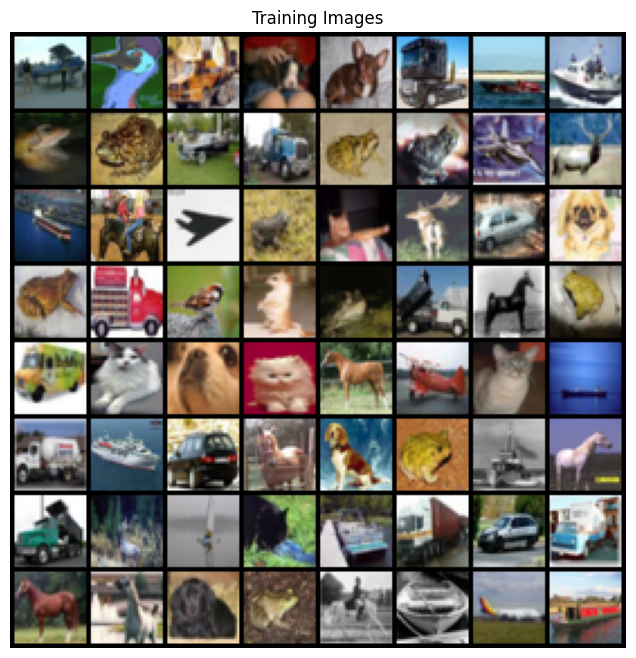

In [14]:
data = next(iter(train_loader))
data[0].shape

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(data[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


In [15]:

def init_weights(m):
    """Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. """
    clazz = m.__class__.__name__
    if clazz.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif clazz.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

dc_gen.apply(init_weights)
dc_dis.apply(init_weights)



NetD(
  (sequence): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)

In [16]:
def train(g, d, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch):
    derrors, gerrors, gen_imgs= [],[], []
    
    for idx, data in enumerate(train_loader):    
        d.zero_grad()
        imgs = data[0].to(device)
        batch_size = imgs.size(0)
        label = torch.full((batch_size,), 1, dtype=torch.float, device=device)
        
        # Real images with discriminator
        output = d(imgs)
        
        d_real_error = loss_fn(output.squeeze(), label)
        d_real_error.backward()      

        # Fake images with discriminator
        zvector = torch.randn((batch_size, 100, 1, 1), device=device)
        fakes = g(zvector)
        output = d(fakes.detach())
        bad_label = torch.full((batch_size,), 0, dtype=torch.float, device=device)
        d_fake_error = loss_fn(output.squeeze(),bad_label)
        d_fake_error.backward()

        total_Derror = d_fake_error + d_real_error
        derrors.append(total_Derror.item())
        dis_optimizer.step()

        # Do the loss of G
        g.zero_grad()
        trick_label = torch.full((batch_size,), 1, dtype=torch.float, device=device)
        #fakes = g(zvector)
        output = d(fakes)
        g_error = loss_fn(output.squeeze(), trick_label)
        gerrors.append(g_error.item())
        #print(g_error)
        g_error.backward()
        gen_optimizer.step()

        if idx == (len(train_loader) -1):
            with torch.no_grad():
                extra_fake = g(fixed_noise).detach().cpu()
                gen_imgs.append(vutils.make_grid(extra_fake, padding=2, normalize=True))
                
            

    return derrors, gerrors, gen_imgs

In [17]:
# Training Loop
alld, allg, all_imgs = [],[],[]
for epoch in range(epochs):
    d_real_error, g_error, gen_imgs = train(dc_gen, dc_dis, gen_optimizer, dis_optimizer, loss_fn, train_loader, epoch)
    print(d_real_error[-1], g_error[-1])
    alld.extend(d_real_error)
    allg.extend(g_error)
    all_imgs.extend(gen_imgs)


0.6208450794219971 3.9714062213897705
0.9860470294952393 2.260131597518921
0.6330844163894653 3.372938871383667
0.9143069386482239 2.1156201362609863
0.7247124910354614 2.302579164505005
0.7168411612510681 3.3093948364257812
0.8908190727233887 2.96746563911438
1.2114033699035645 3.2941646575927734
1.0264837741851807 3.8628315925598145
1.751782774925232 0.6282049417495728
1.2467734813690186 1.0579577684402466
0.9663735628128052 2.3412766456604004
1.5305379629135132 2.4136269092559814
0.7787202596664429 2.281384229660034
0.8784328699111938 1.9140557050704956
0.8976391553878784 2.44559907913208
0.8943207263946533 3.6840035915374756
1.0928585529327393 1.3006370067596436
1.043892741203308 1.3466339111328125
0.883865237236023 1.8623145818710327


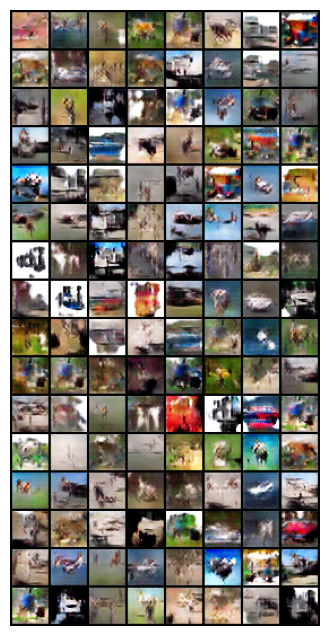

In [18]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
image = [[plt.imshow(np.transpose(i, (1,2,0)), animated=True)] for i in all_imgs]
ani = animation.ArtistAnimation(fig, image, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [19]:
len(allg)

7820